## Imports and Setup

In [1]:
import torch
torch.cuda.empty_cache() 

In [2]:
torch.cuda.set_device(1)

In [3]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [4]:
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM, Trainer, TrainingArguments
from transformers import LlamaTokenizer, LlamaForCausalLM
from datasets import load_dataset

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

/home/b22cs092/.local/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: cuda


In [ ]:
import torch
torch.cuda.empty_cache()
import time
import numpy as np
import pandas as pd

In [6]:
print("GPUs Available:", torch.cuda.device_count())
for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)}")

GPUs Available: 1
GPU 0: NVIDIA L40S


In [ ]:
print(torch.cuda.current_device())

1


In [9]:
dataset = load_dataset('wikitext', 'wikitext-2-raw-v1')

print("Sample from WikiText-2:")
for i in range(5):
    print(f"Example {i}: {repr(dataset['train'][i]['text'][:100])}...")

Sample from WikiText-2:
Example 0: ''...
Example 1: ' = Valkyria Chronicles III = \n'...
Example 2: ''...
Example 3: ' Senjō no Valkyria 3 : Unrecorded Chronicles ( Japanese : 戦場のヴァルキュリア3 , lit . Valkyria of the Battle'...
Example 4: ' The game began development in 2010 , carrying over a large portion of the work done on Valkyria Chr'...


### Tokenizer

In [10]:
def tokenize_function(examples):
    inputs = tokenizer(
        examples['text'], 
        truncation=True, 
        padding='max_length', 
        max_length=512,
        return_attention_mask=True,
    )
    inputs['labels'] = inputs['input_ids'].copy()
    return inputs

## GPT-2 Finetuning

In [ ]:
tokenizer = AutoTokenizer.from_pretrained("openai-community/gpt2")
model = AutoModelForCausalLM.from_pretrained("openai-community/gpt2").to(device)



In [ ]:
tokenizer.pad_token = tokenizer.eos_token

In [ ]:
model.config.pad_token_id = tokenizer.pad_token_id

In [ ]:
tokenized_datasets = dataset.map(tokenize_function, batched=True)

In [ ]:
tokenized_datasets

In [ ]:
tokenized_datasets['train']

In [16]:
training_args = TrainingArguments(
    output_dir='kv/results',
    eval_strategy='epoch',
    num_train_epochs=1,
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='kv/logs'
)

In [17]:
import os
os.makedirs("kv", exist_ok=True)


In [16]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets['train'],
    eval_dataset=tokenized_datasets['validation'],
)


In [17]:

trainer.train()

model_output_dir = 'kv/results/model'

model.save_pretrained(model_output_dir)
tokenizer.save_pretrained(model_output_dir)

/home/b22cs092/.local/lib/python3.12/site-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(


Epoch,Training Loss,Validation Loss
1,0.425800,0.418304


/home/b22cs092/.local/lib/python3.12/site-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(
/home/b22cs092/.local/lib/python3.12/site-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(
/home/b22cs092/.local/lib/python3.12/site-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(
/home/b22cs092/.local/lib/python3.12/site-packages/torch/nn/parallel/_functions.py:71: UserWarning: Was asked to gather along dimension 0, but all input tensors were scalars; will instead unsqueeze and return a vector.
  warnings.warn(
/home/b22cs092/.local/lib/python3.12/site-packages/torch

('kv/results/model/tokenizer_config.json',
 'kv/results/model/special_tokens_map.json',
 'kv/results/model/vocab.json',
 'kv/results/model/merges.txt',
 'kv/results/model/added_tokens.json',
 'kv/results/model/tokenizer.json')

In [26]:
print(type(model))


<class 'transformers.models.gpt2.modeling_gpt2.GPT2LMHeadModel'>


In [27]:
print(tokenizer.model_max_length)
print(tokenizer.padding_side)


1024
right


## TinyLlama Finetuning

In [28]:
import time
import numpy as np
import pandas as pd

In [14]:
!PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True

In [31]:
model_name = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name).to(device)
tokenizer.pad_token = tokenizer.eos_token
model.generation_config.pad_token_id = tokenizer.pad_token_id

In [33]:
tokenized_datasets = dataset.map(tokenize_function, batched=True)

Map: 100%|███████████████████████████████████████████████████████████████| 36718/36718 [00:06<00:00, 5886.00 examples/s]


In [34]:
tokenized_datasets

DatasetDict({
    test: Dataset({
        features: ['text', 'input_ids', 'attention_mask', 'labels'],
        num_rows: 4358
    })
    train: Dataset({
        features: ['text', 'input_ids', 'attention_mask', 'labels'],
        num_rows: 36718
    })
    validation: Dataset({
        features: ['text', 'input_ids', 'attention_mask', 'labels'],
        num_rows: 3760
    })
})

In [24]:
model.train()

LlamaForCausalLM(
  (model): LlamaModel(
    (embed_tokens): Embedding(32000, 2048)
    (layers): ModuleList(
      (0-21): 22 x LlamaDecoderLayer(
        (self_attn): LlamaAttention(
          (q_proj): Linear(in_features=2048, out_features=2048, bias=False)
          (k_proj): Linear(in_features=2048, out_features=256, bias=False)
          (v_proj): Linear(in_features=2048, out_features=256, bias=False)
          (o_proj): Linear(in_features=2048, out_features=2048, bias=False)
        )
        (mlp): LlamaMLP(
          (gate_proj): Linear(in_features=2048, out_features=5632, bias=False)
          (up_proj): Linear(in_features=2048, out_features=5632, bias=False)
          (down_proj): Linear(in_features=5632, out_features=2048, bias=False)
          (act_fn): SiLU()
        )
        (input_layernorm): LlamaRMSNorm((2048,), eps=1e-05)
        (post_attention_layernorm): LlamaRMSNorm((2048,), eps=1e-05)
      )
    )
    (norm): LlamaRMSNorm((2048,), eps=1e-05)
    (rotary_emb): 

In [25]:
training_args = TrainingArguments(
    output_dir='kv/results_llama',
    eval_strategy='epoch',
    num_train_epochs=1,
    per_device_train_batch_size=1,
    per_device_eval_batch_size=1,
    warmup_steps=500,
    weight_decay=0.01,
    dataloader_num_workers=0,       # Disable multiprocessing
    dataloader_pin_memory=False, 
    logging_dir='kv/logs_llama'
)

In [26]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets['train'],
    eval_dataset=tokenized_datasets['validation'],
)

In [27]:
import gc
torch.cuda.empty_cache()
gc.collect()

46

In [31]:

trainer.train()

model_output_dir = 'kv/results_llama/model'

model.save_pretrained(model_output_dir)
tokenizer.save_pretrained(model_output_dir)

Epoch,Training Loss,Validation Loss
1,0.363800,0.449169


('kv/results_llama/model/tokenizer_config.json',
 'kv/results_llama/model/special_tokens_map.json',
 'kv/results_llama/model/tokenizer.model',
 'kv/results_llama/model/added_tokens.json',
 'kv/results_llama/model/tokenizer.json')

## Inference

In [11]:
model_output_llama_dir = 'kv/results_llama/model'

In [12]:
model_output_gpt2_dir='kv/results/model'

In [13]:
gpt2_tokenizer = AutoTokenizer.from_pretrained(model_output_gpt2_dir)
gpt2_model = AutoModelForCausalLM.from_pretrained(model_output_gpt2_dir).to(device)
gpt2_model.eval()

GPT2LMHeadModel(
  (transformer): GPT2Model(
    (wte): Embedding(50257, 768)
    (wpe): Embedding(1024, 768)
    (drop): Dropout(p=0.1, inplace=False)
    (h): ModuleList(
      (0-11): 12 x GPT2Block(
        (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (attn): GPT2Attention(
          (c_attn): Conv1D(nf=2304, nx=768)
          (c_proj): Conv1D(nf=768, nx=768)
          (attn_dropout): Dropout(p=0.1, inplace=False)
          (resid_dropout): Dropout(p=0.1, inplace=False)
        )
        (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (mlp): GPT2MLP(
          (c_fc): Conv1D(nf=3072, nx=768)
          (c_proj): Conv1D(nf=768, nx=3072)
          (act): NewGELUActivation()
          (dropout): Dropout(p=0.1, inplace=False)
        )
      )
    )
    (ln_f): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  )
  (lm_head): Linear(in_features=768, out_features=50257, bias=False)
)

In [14]:
llama_tokenizer = AutoTokenizer.from_pretrained(model_output_llama_dir)
llama_model = AutoModelForCausalLM.from_pretrained(model_output_llama_dir).to(device)
llama_model.eval()

LlamaForCausalLM(
  (model): LlamaModel(
    (embed_tokens): Embedding(32000, 2048)
    (layers): ModuleList(
      (0-21): 22 x LlamaDecoderLayer(
        (self_attn): LlamaAttention(
          (q_proj): Linear(in_features=2048, out_features=2048, bias=False)
          (k_proj): Linear(in_features=2048, out_features=256, bias=False)
          (v_proj): Linear(in_features=2048, out_features=256, bias=False)
          (o_proj): Linear(in_features=2048, out_features=2048, bias=False)
        )
        (mlp): LlamaMLP(
          (gate_proj): Linear(in_features=2048, out_features=5632, bias=False)
          (up_proj): Linear(in_features=2048, out_features=5632, bias=False)
          (down_proj): Linear(in_features=5632, out_features=2048, bias=False)
          (act_fn): SiLU()
        )
        (input_layernorm): LlamaRMSNorm((2048,), eps=1e-05)
        (post_attention_layernorm): LlamaRMSNorm((2048,), eps=1e-05)
      )
    )
    (norm): LlamaRMSNorm((2048,), eps=1e-05)
    (rotary_emb): 

In [ ]:
test_dataset = load_dataset("wikitext", "wikitext-2-raw-v1", split="test")
modified_prompts = []

for example in test_dataset:
    text = example['text'].strip()
    if len(text) > 200 and not text.startswith('='):
        words = text.split()
        if len(words) > 200:
            partial_text = ' '.join(words[:200])  # First 200 words to encourage sentence prediction
            modified_prompts.append(partial_text)


prompt_texts = modified_prompts

In [ ]:
import numpy as np
import random
def set_all_seeds(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_all_seeds(42)

In [21]:
from transformers import AutoModelForCausalLM

model_name = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"
model = AutoModelForCausalLM.from_pretrained(model_name)

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")


Total parameters: 1,100,048,384
Trainable parameters: 1,100,048,384


In [17]:
model_name = "gpt2"
model = AutoModelForCausalLM.from_pretrained(model_name)

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Total parameters: {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")

Total parameters: 124,439,808
Trainable parameters: 124,439,808


 KV caching improves throughput and lowers latency

In [18]:
!pip install plotly --break-system-packages --user

In [ ]:
import torch
import time
import numpy as np
import pandas as pd
from transformers import GPT2LMHeadModel, GPT2Tokenizer
from evaluate import load
from scipy.spatial.distance import pdist, squareform
from scipy.sparse.csgraph import connected_components
from datetime import datetime
import math


# KV Compression Optimization - Graphs

In [ ]:
from datetime import datetime
import torch
import time
import numpy as np
import pandas as pd
from transformers import AutoModelForCausalLM, AutoTokenizer
from transformers.cache_utils import DynamicCache, Cache
import math
import matplotlib.pyplot as plt

 ## Function to calculate perplexity 
@torch._dynamo.disable
def calculate_perplexity(model, tokenizer, text_list, device="cuda"):
    
    model.eval()
    total_loss = 0
    total_tokens = 0
    for text in text_list:
        if not text:
            continue
        encodings= tokenizer(text, return_tensors="pt", padding=True, truncation=True)
        input_ids= encodings.input_ids.to(device)
        attention_mask= encodings.attention_mask.to(device)
        target_ids= input_ids.clone()
        target_ids[attention_mask == 0] = -100
        
        with torch.no_grad():
            outputs= model(input_ids, labels=target_ids, attention_mask=attention_mask)
            loss= outputs.loss
            num_tokens= (target_ids != -100).sum().item()
            if num_tokens> 0:
                total_loss += loss.item() * num_tokens
                total_tokens += num_tokens
                
    if total_tokens == 0:
        return float("inf")
    avg_loss = total_loss / total_tokens
    perplexity = math.exp(avg_loss)
    return perplexity

def get_tensor_size_bytes(tensor): # size for KV vectors
    return tensor.numel()*tensor.element_size()

def extract_kv_pairs(past_key_values: Cache) -> list:
    ##Extract a list of (k, v) 4D tensors from a Cache object
    kv_pairs = []
    #iterate through each layer in past_key_values
    for layer_cache in past_key_values:
        kv_pairs.append(layer_cache)
    return kv_pairs

def rebuild_cache(pruned_kv_list: list, is_llama: bool) -> Cache:
    ## Rebuilds a Cache object from a list of pruned (k,v) tensors
    if is_llama: ##Llama
        return DynamicCache.from_legacy_cache(past_key_values=tuple(pruned_kv_list))
    else: # GPT-2, return a standard tuple
        return tuple(pruned_kv_list)

################### Main Hybrid Pruning Module (Sink + Clustering) #############################
class HybridCompressionModule:
  
    def __init__(self, epsilon: float, num_sink_tokens: int, device: str, clustering_iterations=20):
        self.epsilon = epsilon
        self.num_sink_tokens = num_sink_tokens
        self.device = device
        self.clustering_iterations = clustering_iterations

## find clusters using the adjacency matrix
    def _gpu_connected_components(self, adj_matrix):
        num_heads, seq_len, _ = adj_matrix.shape
        labels = torch.arange(seq_len, device=self.device, dtype=torch.long).unsqueeze(0).expand(num_heads, -1)
        adj_matrix_with_loops = adj_matrix | torch.eye(seq_len, device=self.device, dtype=torch.bool).unsqueeze(0)
        for _ in range(self.clustering_iterations):
            propagated_labels = torch.where(adj_matrix_with_loops, labels.unsqueeze(1), seq_len)
            min_neighbor_labels = torch.min(propagated_labels, dim=2).values
            new_labels = torch.min(labels, min_neighbor_labels)
            if torch.equal(labels, new_labels): break
            labels = new_labels
        return labels
## Actual pruning using clustering and centroids
    def _prune_kv_pair(self, k_state_4d, v_state_4d):
        
        ##Prunes a single layer's KV pair using clustering with centroids.
        ##k_state_4d, v_state_4d: (batch, num_heads, seq_len, head_dim)
    
        batch_size, num_heads, seq_len, head_dim = k_state_4d.shape
    
        # If sequence is too short, no pruning
        if seq_len <= self.num_sink_tokens:
            return k_state_4d, v_state_4d
    
        # Keep sink tokens intact
        k_sink = k_state_4d[:, :, :self.num_sink_tokens, :]
        v_sink = v_state_4d[:, :, :self.num_sink_tokens, :]
    
        # Prunable tokens
        k_prunable = k_state_4d[:, :, self.num_sink_tokens:, :]  # (1, H, L', D)
        v_prunable = v_state_4d[:, :, self.num_sink_tokens:, :]
        k_prunable_3d = k_prunable.squeeze(0)  # (H, L', D)
        v_prunable_3d = v_prunable.squeeze(0)
    
        prunable_seq_len = k_prunable_3d.shape[1]
        if prunable_seq_len <= 1:
            return k_state_4d, v_state_4d
    
        # Pairwise distances between tokens
        distances = torch.cdist(k_prunable_3d, k_prunable_3d)  # (H, L', L')
        adjacency_matrix = distances < self.epsilon
    
        # Cluster labels via connected components
        labels = self._gpu_connected_components(adjacency_matrix)
    
        # Remap labels per head (0..num_clusters-1)
        max_components = 0
        remapped_labels_list = []
        for h in range(num_heads):
            unique, inverse = torch.unique(labels[h], return_inverse=True)
            remapped_labels_list.append(inverse)
            if unique.numel() > max_components:
                max_components = unique.numel()
        remapped_labels = torch.stack(remapped_labels_list)  # (H, L')
        remapped_labels_exp = remapped_labels.unsqueeze(-1).expand(-1, -1, head_dim)  # (H, L', D)
        centroids_sum_k = torch.zeros(
            (num_heads, max_components, head_dim),
            dtype=k_prunable_3d.dtype, device=self.device
        )
        centroids_sum_v = torch.zeros_like(centroids_sum_k)
        counts = torch.zeros(
            (num_heads, max_components), device=self.device, dtype=torch.long
        )
        counts.scatter_add_(1, remapped_labels, torch.ones_like(remapped_labels))

        # Sum the K and V vectors for each cluster
        centroids_sum_k.scatter_add_(1, remapped_labels_exp, k_prunable_3d)
        centroids_sum_v.scatter_add_(1, remapped_labels_exp, v_prunable_3d)
        counts = counts.unsqueeze(-1).clamp(min=1)
        # Compute centroids (the correct average)
        centroids_k = centroids_sum_k / counts
        centroids_v = centroids_sum_v / counts
    
        # Merge sink tokens + centroids
        final_k = torch.cat([k_sink, centroids_k.unsqueeze(0)], dim=2)  # (1, H, S + C, D)
        final_v = torch.cat([v_sink, centroids_v.unsqueeze(0)], dim=2)
    
        return final_k, final_v


    def compress_kv_cache(self, past_key_values: Cache, is_llama: bool) -> list:
        # GPT-2 uses a tuple, Llama uses a Cache object
        if is_llama:
            kv_pairs = extract_kv_pairs(past_key_values)
        else:
            kv_pairs = list(past_key_values)

        return [self._prune_kv_pair(k, v) for k, v in kv_pairs]

################################### COMPLETE TESTING #######################################################
def run_single_benchmark(model, tokenizer, prompt_texts, mode, device,
                         epsilon=2.0, num_sink_tokens=4,
                         max_new_tokens=50, compression_interval=16,
                         standard_cache_sizes=None):
    print(f"--- Evaluating with Mode: {mode.upper()} ---")
    if mode == 'compressed_cache':
        print(f"      (Epsilon: {epsilon}, Sink: {num_sink_tokens} tokens, Interval: {compression_interval} tokens)")

    is_llama = "llama" in model.config.model_type.lower()
    if torch.cuda.is_available():
        torch.cuda.empty_cache(); torch.cuda.reset_peak_memory_stats()

    compression_module = HybridCompressionModule(epsilon, num_sink_tokens, device)
    times, total_generated_tokens, generated_texts_for_ppl, all_prompt_results = [], 0, [], []

    for i, prompt in enumerate(prompt_texts):
        inputs = tokenizer(prompt, return_tensors="pt").to(device)
        input_len = inputs.input_ids.shape[1]
        print(f"Prompt: {i} ", prompt)
        print(f"Input tokens: {input_len}")
        torch.manual_seed(42)
        
        start_time = time.time()
        
        with torch.no_grad():
            if mode == 'compressed_cache':
                generated_ids = inputs.input_ids
                attention_mask = inputs.attention_mask
                past_key_values = None

                for step in range(max_new_tokens):
                    if past_key_values is not None:
                        if is_llama:
                            current_seq_len = past_key_values.get_seq_length()
                        else:
                            current_seq_len = past_key_values[0][0].shape[2]
                        input_token = generated_ids[:, -1:]
                    else:
                        current_seq_len = generated_ids.shape[1]
                        input_token = generated_ids

                    model_inputs = {
                        'input_ids': input_token, 
                        'past_key_values': past_key_values, 
                        'use_cache': True,
                        'attention_mask': attention_mask
                    }
                    if is_llama:
                        model_inputs['cache_position'] = torch.arange(current_seq_len, current_seq_len + input_token.shape[1], device=device)

                    outputs = model(**model_inputs)
                    next_token = torch.argmax(outputs.logits[:, -1, :], dim=-1).unsqueeze(-1)
                    
                    if tokenizer.eos_token_id is not None and next_token.item() == tokenizer.eos_token_id:
                        break

                    generated_ids = torch.cat([generated_ids, next_token], dim=-1)
                    attention_mask = torch.cat([attention_mask, torch.ones((attention_mask.shape[0], 1), device=device, dtype=torch.long)], dim=1)
                    
                    past_key_values = outputs.past_key_values

                    num_generated = step + 1
                    if num_generated % compression_interval == 0 and past_key_values is not None:
                        pruned_kv_list = compression_module.compress_kv_cache(past_key_values, is_llama)
                        past_key_values = rebuild_cache(pruned_kv_list, is_llama)
                        if is_llama:
                            new_seq_len = past_key_values.get_seq_length()
                        else:
                            new_seq_len = past_key_values[0][0].shape[2]
                        
                        attention_mask = torch.ones((inputs.input_ids.shape[0], new_seq_len), device=device, dtype=torch.long)
                
                sequences = generated_ids
            else:
                use_cache_flag = (mode == 'standard_cache')
                if mode == 'no_cache':
                    use_cache_flag = False
                
                outputs = model.generate(**inputs, max_new_tokens=max_new_tokens, use_cache=use_cache_flag,
                                         do_sample=False, pad_token_id=tokenizer.eos_token_id,
                                         return_dict_in_generate=True, output_scores=True)
                sequences = outputs.sequences

        if torch.cuda.is_available(): torch.cuda.synchronize()
        elapsed_time = time.time() - start_time
        generated_tokens = sequences.shape[1] - input_len
        if generated_tokens <= 0: continue
        total_generated_tokens += generated_tokens
        times.append(elapsed_time)
        full_generated_text = tokenizer.decode(sequences[0], skip_special_tokens=True)
        generated_part_text = tokenizer.decode(sequences[0][input_len:], skip_special_tokens=True)
        generated_texts_for_ppl.append(full_generated_text)
        print(f"Generated tokens: {generated_tokens}")
        print(f"Time taken: {elapsed_time:.3f} seconds")
        print(f"Generated part only: {repr(generated_part_text)}")
        print("-" * 50)

        total_kv_bytes = 0
        final_past_key_values = None
        if 'outputs' in locals() and hasattr(outputs, 'past_key_values') and outputs.past_key_values is not None:
            final_past_key_values = outputs.past_key_values
        elif 'past_key_values' in locals() and past_key_values is not None:
            final_past_key_values = past_key_values
            
        if final_past_key_values:
            kv_pairs = extract_kv_pairs(final_past_key_values) if is_llama else list(final_past_key_values)
            print(f"\nKV Cache Shapes and Sizes per Layer (final state, mode={mode}):")
            for layer_idx, (k, v) in enumerate(kv_pairs):
                layer_bytes = get_tensor_size_bytes(k) + get_tensor_size_bytes(v)
                total_kv_bytes += layer_bytes
                print(f"  Layer {layer_idx}: K {k.shape}, V {v.shape}, Size: {layer_bytes/1024:.2f} KiB")
            print(f"Total KV Cache Size: {total_kv_bytes/1024:.2f} KiB\n")
        
        memory_saving_kib = 0
        memory_saving_percent = 'N/A'
        
        if mode == 'compressed_cache' and standard_cache_sizes:
            standard_size_kib = standard_cache_sizes.get(i) # i is the prompt_id
            if standard_size_kib and isinstance(standard_size_kib, (int, float)) and standard_size_kib > 0:
                standard_size_bytes = standard_size_kib * 1024
                if total_kv_bytes > 0:
                    memory_saving_kib = (standard_size_bytes - total_kv_bytes) / 1024
                    saving_percent = (memory_saving_kib * 1024 / standard_size_bytes) * 100 if standard_size_bytes > 0 else 0
                    memory_saving_percent = round(saving_percent, 1)
                    
                    print(f"  --> Comparison with Standard Cache:")
                    print(f"      Standard Size  : {standard_size_kib:.2f} KiB")
                    print(f"      Compressed Size: {total_kv_bytes/1024:.2f} KiB")
                    print(f"      Saving         : {memory_saving_kib:.2f} KiB ({memory_saving_percent:.1f}%)\n")

        output_len = sequences.shape[1]
        result_row = {'mode': mode, 'epsilon': epsilon if mode == 'compressed_cache' else 'N/A', 'prompt_id': i,
                      'prompt_text': prompt[:100] + "..." if len(prompt) > 100 else prompt,
                      'input_tokens': input_len, 'generated_tokens': generated_tokens, 'total_tokens': output_len,
                      'time_taken_sec': round(elapsed_time, 3),
                      'kv_cache_size_kib': round(total_kv_bytes/1024, 2) if total_kv_bytes > 0 else 'N/A',
                      'kv_cache_saving_kib': round(memory_saving_kib, 2) if memory_saving_kib > 0 else 'N/A',
                      'kv_cache_saving_percent': memory_saving_percent,
                      'generated_part': generated_part_text[:200] + "..." if len(generated_part_text) > 200 else generated_part_text}
        all_prompt_results.append(result_row)
    
    avg_latency = np.mean(times) if times else 0
    std_latency = np.std(times) if times else 0
    total_time = sum(times)
    throughput = total_generated_tokens / total_time if total_time > 0 else 0
    peak_memory_mib = torch.cuda.max_memory_allocated() / 1024 / 1024 if torch.cuda.is_available() else 0
    
    avg_saving_kib = 0
    if mode == 'compressed_cache':
        savings = [r['kv_cache_saving_kib'] for r in all_prompt_results if isinstance(r['kv_cache_saving_kib'], (int, float)) and r['kv_cache_saving_kib'] != 'N/A']
        if savings: avg_saving_kib = np.mean(savings)

    print("  Calculating perplexity...")
    perplexity_score = calculate_perplexity(model, tokenizer, generated_texts_for_ppl, device)
    summary = {'mode': f"SUMMARY_{mode}", 'epsilon': epsilon if mode == 'compressed_cache' else 'N/A',
               'avg_perplexity': round(perplexity_score, 4),'throughput_tokens_per_sec': round(throughput, 2),
               'avg_latency_sec': round(avg_latency, 3),'std_latency_sec': round(std_latency, 3),
               'peak_memory_mib': round(peak_memory_mib, 2),
               'avg_memory_saving_kib': round(avg_saving_kib, 2)}

    print(f"\nSummary for mode={mode}:")
    print(f"  Average Latency: {summary['avg_latency_sec']:.3f} ± {summary['std_latency_sec']:.3f} sec")
    print(f"  Throughput: {summary['throughput_tokens_per_sec']:.2f} tokens/sec")
    print(f"  Perplexity on generated outputs: {summary['avg_perplexity']:.4f}")
    if peak_memory_mib > 0: print(f"  Peak Memory Usage for this mode: {summary['peak_memory_mib']:.2f} MiB")
    if avg_saving_kib > 0: print(f"  Average Memory Saving on successful savings (>0): {summary['avg_memory_saving_kib']:.2f} KiB")
    print("="*60 + "\n")
    return summary, all_prompt_results

###################################     Initial Plots  ##################################
def plot_results(plot_data, baseline_summary, all_results_df):
    epsilons = [d['epsilon'] for d in plot_data]
    perplexities = [d['avg_perplexity'] for d in plot_data]
    throughputs = [d['throughput_tokens_per_sec'] for d in plot_data]
    latencies = [d['avg_latency_sec'] for d in plot_data]

    baseline_perplexity = baseline_summary.get('avg_perplexity')
    baseline_throughput = baseline_summary.get('throughput_tokens_per_sec')
    baseline_latency = baseline_summary.get('avg_latency_sec')

    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    fig.suptitle('KV Cache Compression Performance vs. Epsilon', fontsize=18)
    
    text_bbox = dict(boxstyle="round,pad=0.3", fc="white", ec="gray", lw=0.5, alpha=0.8) 
    text_props_min = {'fontsize': 9, 'color': 'darkgreen', 'ha': 'left', 'va': 'top'}
    text_props_max = {'fontsize': 9, 'color': 'darkred', 'ha': 'left', 'va': 'bottom'}
    offset_x = 0.5 # Small offset in x-direction for labels

    ############################################ Perplexity Plot

    ax = axes[0, 0]
    ax.plot(epsilons, perplexities, marker='o', linestyle='-', color='b', label='Compressed Cache')
    if baseline_perplexity is not None:
        ax.axhline(y=baseline_perplexity, color='r', linestyle='--', label=f'Standard Cache PPL ({baseline_perplexity:.2f})')
    
    min_idx = np.argmin(perplexities)
    max_idx = np.argmax(perplexities)
    

    ax.text(epsilons[min_idx] + offset_x, perplexities[min_idx],
            f'Min: {perplexities[min_idx]:.2f}',
            bbox=text_bbox, **text_props_min)
    
    if min_idx != max_idx:
        ax.text(epsilons[max_idx] + offset_x, perplexities[max_idx],
                f'Max: {perplexities[max_idx]:.2f}',
                bbox=text_bbox, **text_props_max)

    ax.set_title('Model Quality (Perplexity)')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Perplexity')
    ax.grid(True)
    ax.legend()


    ###########################################  Throughput Plot
    ax = axes[0, 1]
    ax.plot(epsilons, throughputs, marker='s', linestyle='-', color='g', label='Compressed Cache')
    if baseline_throughput is not None:
        ax.axhline(y=baseline_throughput, color='r', linestyle='--', label=f'Standard Cache Thr. ({baseline_throughput:.2f})')

    min_idx = np.argmin(throughputs)
    max_idx = np.argmax(throughputs)
    
    ax.text(epsilons[min_idx] + offset_x, throughputs[min_idx],
            f'Min: {throughputs[min_idx]:.2f}',
            bbox=text_bbox, **text_props_min)

    if min_idx != max_idx:
        ax.text(epsilons[max_idx] + offset_x, throughputs[max_idx],
                f'Max: {throughputs[max_idx]:.2f}',
                bbox=text_bbox, **text_props_max)

    ax.set_title('Throughput')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Throughput (tokens/sec)')
    ax.grid(True)
    ax.legend()


    ########################################## Latency Plot
    ax = axes[1, 0]
    ax.plot(epsilons, latencies, marker='^', linestyle='-', color='purple', label='Compressed Cache')
    if baseline_latency is not None:
        ax.axhline(y=baseline_latency, color='r', linestyle='--', label=f'Standard Cache Lat. ({baseline_latency:.3f})')
        
    min_idx = np.argmin(latencies)
    max_idx = np.argmax(latencies)
    ax.text(epsilons[min_idx] + offset_x, latencies[min_idx],
            f'Min: {latencies[min_idx]:.3f}s',
            bbox=text_bbox, **text_props_min)
    
    if min_idx != max_idx:
        ax.text(epsilons[max_idx] + offset_x, latencies[max_idx],
                f'Max: {latencies[max_idx]:.3f}s',
                bbox=text_bbox, **text_props_max)

    ax.set_title('Latency')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Average Latency (seconds)')
    ax.grid(True)
    ax.legend()


    ############################# Max Compression Percentage Plot
    ax = axes[1, 1]
    max_compression_percentages = []
    if not all_results_df.empty:
        compressed_df = all_results_df[all_results_df['mode'] == 'compressed_cache'].copy()
        compressed_df['kv_cache_saving_percent'] = pd.to_numeric(compressed_df['kv_cache_saving_percent'], errors='coerce')
        if not compressed_df.empty:
            max_savings_by_epsilon = compressed_df.groupby('epsilon')['kv_cache_saving_percent'].max()
            max_compression_percentages = [max_savings_by_epsilon.get(eps, 0) for eps in epsilons]

    ax.plot(epsilons, max_compression_percentages, marker='d', linestyle='-', color='orange', label='Max Compression %')
    
    if max_compression_percentages:
        min_idx = np.argmin(max_compression_percentages)
        max_idx = np.argmax(max_compression_percentages)
        ax.text(epsilons[min_idx] + offset_x, max_compression_percentages[min_idx],
                f'Min: {max_compression_percentages[min_idx]:.1f}%',
                bbox=text_bbox, **text_props_min)

        if min_idx != max_idx:
            ax.text(epsilons[max_idx] + offset_x, max_compression_percentages[max_idx],
                    f'Max: {max_compression_percentages[max_idx]:.1f}%',
                    bbox=text_bbox, **text_props_max)

    ax.set_title('Maximum Cache Compression vs. Epsilon')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Maximum Compression Saving (%)')
    ax.grid(True)
    ax.legend()
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plot_filename = "compression_metrics_vs_epsilon_llama_8.png" ## save to any file
    plt.savefig(plot_filename)
    print(f"\nMetrics plot saved to {plot_filename}")
    plt.show()


####################################### MAIN RUNNER ###################################################
def run_full_experiment(model, tokenizer, prompt_texts, name="model"):
    device = model.device
    print("--- Warming up model... ---")
    warmup_inputs = tokenizer("Hello", return_tensors="pt").to(device)
    for _ in range(2):
        with torch.no_grad(): model.generate(**warmup_inputs, max_new_tokens=5, use_cache=True)
    if torch.cuda.is_available(): torch.cuda.synchronize()
    print("Warmup complete\n")
    
    all_results_df = pd.DataFrame()
    
    standard_cache_summary, standard_prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'standard_cache', device, max_new_tokens=50)
    all_results_df = pd.concat([all_results_df, pd.DataFrame(standard_prompt_results)], ignore_index=True)

    standard_cache_sizes = {res['prompt_id']: res['kv_cache_size_kib'] for res in standard_prompt_results}
    
    no_cache_summary, no_prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'no_cache', device, max_new_tokens=50)
    all_results_df = pd.concat([all_results_df, pd.DataFrame(no_prompt_results)], ignore_index=True)

    is_llama = "llama" in model.config.model_type.lower()
    if is_llama:
        epsilon_values = [0.5, 2.5, 5.0, 10.0,15.0, 20.0, 25.0, 30.0, 35.0, 40.0]
    else:
        epsilon_values = [0.5, 2.5, 5.0, 10.0, 15.0, 20.0, 25.0, 30.0, 35.0, 40.0]

    compression_summaries = []

    for epsilon in epsilon_values:
        summary, prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'compressed_cache', device,
                                                       epsilon=epsilon, 
                                                       num_sink_tokens=4, 
                                                       max_new_tokens=50, 
                                                       compression_interval=8, ## set to 8 or 16 or 32
                                                       standard_cache_sizes=standard_cache_sizes)
        compression_summaries.append(summary)
        all_results_df = pd.concat([all_results_df, pd.DataFrame(prompt_results)], ignore_index=True)
    
    if compression_summaries:
        plot_results(compression_summaries, standard_cache_summary, all_results_df)
    
    summary_df = pd.DataFrame([standard_cache_summary, no_cache_summary] + compression_summaries)
    
    detailed_filename = f"detailed_results_{name}_final_8.xlsx"
    all_results_df.to_excel(detailed_filename, index=False)
    print(f"Full detailed experiment results saved to {detailed_filename}")
    summary_filename = f"summary_results_{name}_final_8.xlsx"
    summary_df.to_excel(summary_filename, index=False)
    print(f"Summary of experiment results saved to {summary_filename}")


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


--- Warming up model... ---


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


Warmup complete

--- Evaluating with Mode: STANDARD_CACHE ---
Prompt: 0  Boulter starred in two films in 2008 , Daylight Robbery by filmmaker Paris Leonti , and Donkey Punch directed by Olly Blackburn . Boulter portrayed a character named " Sean " in Donkey Punch , who tags along with character " Josh " as the " quiet brother ... who hits it off with Tammi " . Boulter guest starred on a two @-@ part episode arc " Wounds " in May 2008 of the television series Waking the Dead as character " Jimmy Dearden " . He appeared on the television series Survivors as " Neil " in November 2008 . He had a recurring role in ten episodes of the television series Casualty in 2010 , as " Kieron Fletcher " . He portrayed an emergency physician applying for a medical fellowship . He commented on the inherent difficulties in portraying a physician on television : " Playing a doctor is a strange experience . Pretending you know what you 're talking about when you don 't is very bizarre but there are adviser

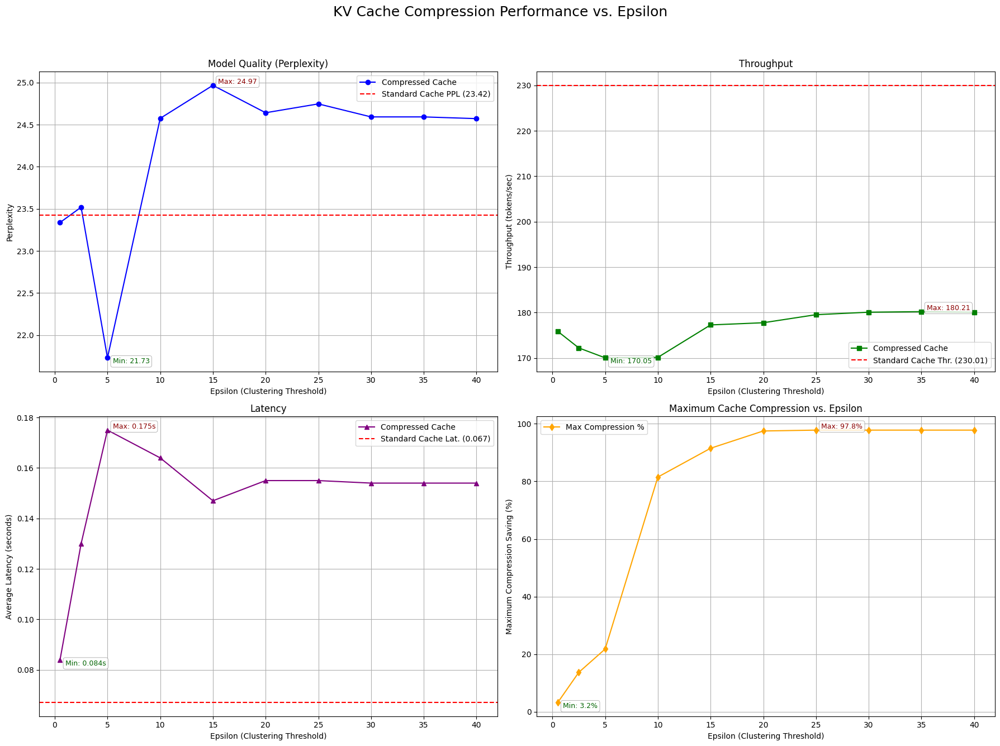

Full detailed experiment results saved to detailed_results_gpt2_final_8.xlsx
Summary of experiment results saved to summary_results_gpt2_final_8.xlsx


In [ ]:
run_full_experiment(gpt2_model, gpt2_tokenizer, prompt_texts[:100], name="gpt2")

### LLAMA

--- Warming up model... ---
Warmup complete

--- Evaluating with Mode: STANDARD_CACHE ---
Prompt: 0  Boulter starred in two films in 2008 , Daylight Robbery by filmmaker Paris Leonti , and Donkey Punch directed by Olly Blackburn . Boulter portrayed a character named " Sean " in Donkey Punch , who tags along with character " Josh " as the " quiet brother ... who hits it off with Tammi " . Boulter guest starred on a two @-@ part episode arc " Wounds " in May 2008 of the television series Waking the Dead as character " Jimmy Dearden " . He appeared on the television series Survivors as " Neil " in November 2008 . He had a recurring role in ten episodes of the television series Casualty in 2010 , as " Kieron Fletcher " . He portrayed an emergency physician applying for a medical fellowship . He commented on the inherent difficulties in portraying a physician on television : " Playing a doctor is a strange experience . Pretending you know what you 're talking about when you don 't is very b

From v4.47 onwards, when a model cache is to be returned, `generate` will return a `Cache` instance instead by default (as opposed to the legacy tuple of tuples format). If you want to keep returning the legacy format, please set `return_legacy_cache=True`.


Generated tokens: 9
Time taken: 0.115 seconds
Generated part only: 'you \'re doing . " \n'
--------------------------------------------------

KV Cache Shapes and Sizes per Layer (final state, mode=standard_cache):
  Layer 0: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 1: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 2: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 3: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 4: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 5: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 6: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 7: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 8: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279

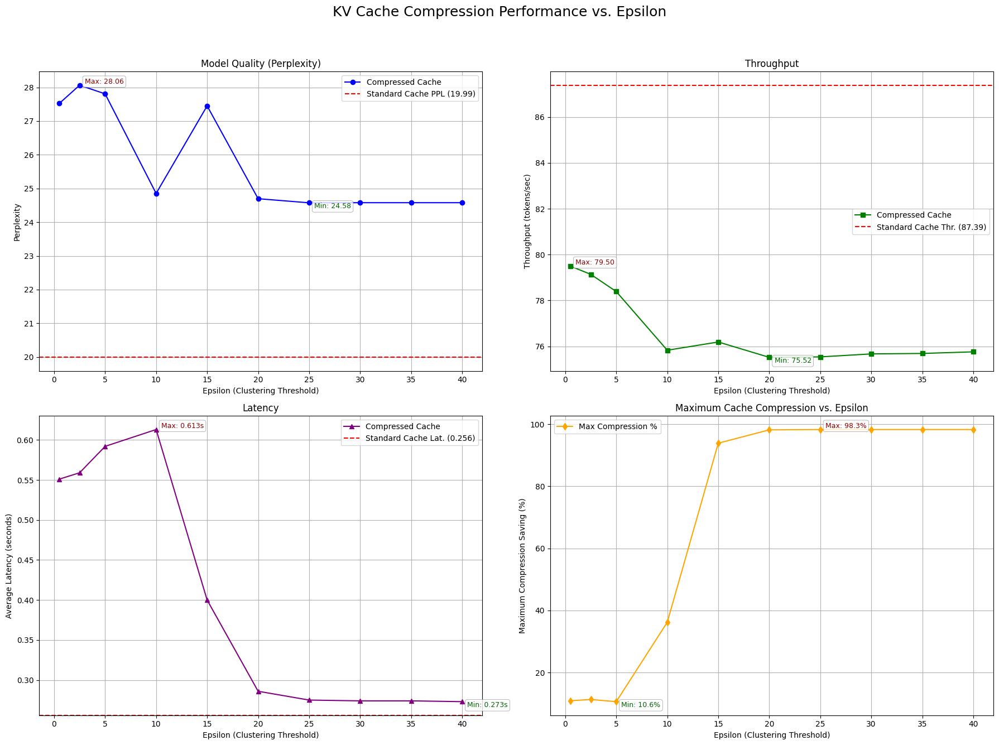

Full detailed experiment results saved to detailed_results_llama_final_8.xlsx
Summary of experiment results saved to summary_results_llama_final_8.xlsx


In [ ]:
run_full_experiment(llama_model, llama_tokenizer, prompt_texts[:100], name="llama")

# HIGHER EPSILONS

In [ ]:
from datetime import datetime
import torch
import time
import numpy as np
import pandas as pd
from transformers import AutoModelForCausalLM, AutoTokenizer
from transformers.cache_utils import DynamicCache, Cache
import math
import matplotlib.pyplot as plt

 ## Function to calculate perplexity 
@torch._dynamo.disable
def calculate_perplexity(model, tokenizer, text_list, device="cuda"):
    
    model.eval()
    total_loss = 0
    total_tokens = 0
    for text in text_list:
        if not text:
            continue
        encodings= tokenizer(text, return_tensors="pt", padding=True, truncation=True)
        input_ids= encodings.input_ids.to(device)
        attention_mask= encodings.attention_mask.to(device)
        target_ids= input_ids.clone()
        target_ids[attention_mask == 0] = -100
        
        with torch.no_grad():
            outputs= model(input_ids, labels=target_ids, attention_mask=attention_mask)
            loss= outputs.loss
            num_tokens= (target_ids != -100).sum().item()
            if num_tokens> 0:
                total_loss += loss.item() * num_tokens
                total_tokens += num_tokens
                
    if total_tokens == 0:
        return float("inf")
    avg_loss = total_loss / total_tokens
    perplexity = math.exp(avg_loss)
    return perplexity

def get_tensor_size_bytes(tensor): # size for KV vectors
    return tensor.numel()*tensor.element_size()

def extract_kv_pairs(past_key_values: Cache) -> list:
    ##Extract a list of (k, v) 4D tensors from a Cache object
    kv_pairs = []
    #iterate through each layer in past_key_values
    for layer_cache in past_key_values:
        kv_pairs.append(layer_cache)
    return kv_pairs

def rebuild_cache(pruned_kv_list: list, is_llama: bool) -> Cache:
    ## Rebuilds a Cache object from a list of pruned (k,v) tensors
    if is_llama: ##Llama
        return DynamicCache.from_legacy_cache(past_key_values=tuple(pruned_kv_list))
    else: # GPT-2, return a standard tuple
        return tuple(pruned_kv_list)

################### Main Hybrid Pruning Module (Sink + Clustering) #############################
class HybridCompressionModule:
  
    def __init__(self, epsilon: float, num_sink_tokens: int, device: str, clustering_iterations=20):
        self.epsilon = epsilon
        self.num_sink_tokens = num_sink_tokens
        self.device = device
        self.clustering_iterations = clustering_iterations

## find clusters using the adjacency matrix
    def _gpu_connected_components(self, adj_matrix):
        num_heads, seq_len, _ = adj_matrix.shape
        labels = torch.arange(seq_len, device=self.device, dtype=torch.long).unsqueeze(0).expand(num_heads, -1)
        adj_matrix_with_loops = adj_matrix | torch.eye(seq_len, device=self.device, dtype=torch.bool).unsqueeze(0)
        for _ in range(self.clustering_iterations):
            propagated_labels = torch.where(adj_matrix_with_loops, labels.unsqueeze(1), seq_len)
            min_neighbor_labels = torch.min(propagated_labels, dim=2).values
            new_labels = torch.min(labels, min_neighbor_labels)
            if torch.equal(labels, new_labels): break
            labels = new_labels
        return labels
## Actual pruning using clustering and centroids
    def _prune_kv_pair(self, k_state_4d, v_state_4d):
        
        ##Prunes a single layer's KV pair using clustering with centroids.
        ##k_state_4d, v_state_4d: (batch, num_heads, seq_len, head_dim)
    
        batch_size, num_heads, seq_len, head_dim = k_state_4d.shape
    
        # If sequence is too short, no pruning
        if seq_len <= self.num_sink_tokens:
            return k_state_4d, v_state_4d
    
        # Keep sink tokens intact
        k_sink = k_state_4d[:, :, :self.num_sink_tokens, :]
        v_sink = v_state_4d[:, :, :self.num_sink_tokens, :]
    
        # Prunable tokens
        k_prunable = k_state_4d[:, :, self.num_sink_tokens:, :]  # (1, H, L', D)
        v_prunable = v_state_4d[:, :, self.num_sink_tokens:, :]
        k_prunable_3d = k_prunable.squeeze(0)  # (H, L', D)
        v_prunable_3d = v_prunable.squeeze(0)
    
        prunable_seq_len = k_prunable_3d.shape[1]
        if prunable_seq_len <= 1:
            return k_state_4d, v_state_4d
    
        # Pairwise distances between tokens
        distances = torch.cdist(k_prunable_3d, k_prunable_3d)  # (H, L', L')
        adjacency_matrix = distances < self.epsilon
    
        # Cluster labels via connected components
        labels = self._gpu_connected_components(adjacency_matrix)
    
        # Remap labels per head (0..num_clusters-1)
        max_components = 0
        remapped_labels_list = []
        for h in range(num_heads):
            unique, inverse = torch.unique(labels[h], return_inverse=True)
            remapped_labels_list.append(inverse)
            if unique.numel() > max_components:
                max_components = unique.numel()
        remapped_labels = torch.stack(remapped_labels_list)  # (H, L')
        remapped_labels_exp = remapped_labels.unsqueeze(-1).expand(-1, -1, head_dim)  # (H, L', D)
        centroids_sum_k = torch.zeros(
            (num_heads, max_components, head_dim),
            dtype=k_prunable_3d.dtype, device=self.device
        )
        centroids_sum_v = torch.zeros_like(centroids_sum_k)
        counts = torch.zeros(
            (num_heads, max_components), device=self.device, dtype=torch.long
        )
        counts.scatter_add_(1, remapped_labels, torch.ones_like(remapped_labels))

        # Sum the K and V vectors for each cluster
        centroids_sum_k.scatter_add_(1, remapped_labels_exp, k_prunable_3d)
        centroids_sum_v.scatter_add_(1, remapped_labels_exp, v_prunable_3d)
        counts = counts.unsqueeze(-1).clamp(min=1)
        # Compute centroids (the correct average)
        centroids_k = centroids_sum_k / counts
        centroids_v = centroids_sum_v / counts
    
        # Merge sink tokens + centroids
        final_k = torch.cat([k_sink, centroids_k.unsqueeze(0)], dim=2)  # (1, H, S + C, D)
        final_v = torch.cat([v_sink, centroids_v.unsqueeze(0)], dim=2)
    
        return final_k, final_v


    def compress_kv_cache(self, past_key_values: Cache, is_llama: bool) -> list:
        # GPT-2 uses a tuple, Llama uses a Cache object
        if is_llama:
            kv_pairs = extract_kv_pairs(past_key_values)
        else:
            kv_pairs = list(past_key_values)

        return [self._prune_kv_pair(k, v) for k, v in kv_pairs]

################################### COMPLETE TESTING #######################################################
def run_single_benchmark(model, tokenizer, prompt_texts, mode, device,
                         epsilon=2.0, num_sink_tokens=4,
                         max_new_tokens=50, compression_interval=16,
                         standard_cache_sizes=None):
    print(f"--- Evaluating with Mode: {mode.upper()} ---")
    if mode == 'compressed_cache':
        print(f"      (Epsilon: {epsilon}, Sink: {num_sink_tokens} tokens, Interval: {compression_interval} tokens)")

    is_llama = "llama" in model.config.model_type.lower()
    if torch.cuda.is_available():
        torch.cuda.empty_cache(); torch.cuda.reset_peak_memory_stats()

    compression_module = HybridCompressionModule(epsilon, num_sink_tokens, device)
    times, total_generated_tokens, generated_texts_for_ppl, all_prompt_results = [], 0, [], []

    for i, prompt in enumerate(prompt_texts):
        inputs = tokenizer(prompt, return_tensors="pt").to(device)
        input_len = inputs.input_ids.shape[1]
        print(f"Prompt: {i} ", prompt)
        print(f"Input tokens: {input_len}")
        torch.manual_seed(42)
        
        start_time = time.time()
        
        with torch.no_grad():
            if mode == 'compressed_cache':
                generated_ids = inputs.input_ids
                attention_mask = inputs.attention_mask
                past_key_values = None

                for step in range(max_new_tokens):
                    if past_key_values is not None:
                        if is_llama:
                            current_seq_len = past_key_values.get_seq_length()
                        else:
                            current_seq_len = past_key_values[0][0].shape[2]
                        input_token = generated_ids[:, -1:]
                    else:
                        current_seq_len = generated_ids.shape[1]
                        input_token = generated_ids

                    model_inputs = {
                        'input_ids': input_token, 
                        'past_key_values': past_key_values, 
                        'use_cache': True,
                        'attention_mask': attention_mask
                    }
                    if is_llama:
                        model_inputs['cache_position'] = torch.arange(current_seq_len, current_seq_len + input_token.shape[1], device=device)

                    outputs = model(**model_inputs)
                    next_token = torch.argmax(outputs.logits[:, -1, :], dim=-1).unsqueeze(-1)
                    
                    if tokenizer.eos_token_id is not None and next_token.item() == tokenizer.eos_token_id:
                        break

                    generated_ids = torch.cat([generated_ids, next_token], dim=-1)
                    attention_mask = torch.cat([attention_mask, torch.ones((attention_mask.shape[0], 1), device=device, dtype=torch.long)], dim=1)
                    
                    past_key_values = outputs.past_key_values

                    num_generated = step + 1
                    if num_generated % compression_interval == 0 and past_key_values is not None:
                        pruned_kv_list = compression_module.compress_kv_cache(past_key_values, is_llama)
                        past_key_values = rebuild_cache(pruned_kv_list, is_llama)
                        if is_llama:
                            new_seq_len = past_key_values.get_seq_length()
                        else:
                            new_seq_len = past_key_values[0][0].shape[2]
                        
                        attention_mask = torch.ones((inputs.input_ids.shape[0], new_seq_len), device=device, dtype=torch.long)
                
                sequences = generated_ids
            else:
                use_cache_flag = (mode == 'standard_cache')
                if mode == 'no_cache':
                    use_cache_flag = False
                
                outputs = model.generate(**inputs, max_new_tokens=max_new_tokens, use_cache=use_cache_flag,
                                         do_sample=False, pad_token_id=tokenizer.eos_token_id,
                                         return_dict_in_generate=True, output_scores=True)
                sequences = outputs.sequences

        if torch.cuda.is_available(): torch.cuda.synchronize()
        elapsed_time = time.time() - start_time
        generated_tokens = sequences.shape[1] - input_len
        if generated_tokens <= 0: continue
        total_generated_tokens += generated_tokens
        times.append(elapsed_time)
        full_generated_text = tokenizer.decode(sequences[0], skip_special_tokens=True)
        generated_part_text = tokenizer.decode(sequences[0][input_len:], skip_special_tokens=True)
        generated_texts_for_ppl.append(full_generated_text)
        print(f"Generated tokens: {generated_tokens}")
        print(f"Time taken: {elapsed_time:.3f} seconds")
        print(f"Generated part only: {repr(generated_part_text)}")
        print("-" * 50)

        total_kv_bytes = 0
        final_past_key_values = None
        if 'outputs' in locals() and hasattr(outputs, 'past_key_values') and outputs.past_key_values is not None:
            final_past_key_values = outputs.past_key_values
        elif 'past_key_values' in locals() and past_key_values is not None:
            final_past_key_values = past_key_values
            
        if final_past_key_values:
            kv_pairs = extract_kv_pairs(final_past_key_values) if is_llama else list(final_past_key_values)
            print(f"\nKV Cache Shapes and Sizes per Layer (final state, mode={mode}):")
            for layer_idx, (k, v) in enumerate(kv_pairs):
                layer_bytes = get_tensor_size_bytes(k) + get_tensor_size_bytes(v)
                total_kv_bytes += layer_bytes
                print(f"  Layer {layer_idx}: K {k.shape}, V {v.shape}, Size: {layer_bytes/1024:.2f} KiB")
            print(f"Total KV Cache Size: {total_kv_bytes/1024:.2f} KiB\n")
        
        memory_saving_kib = 0
        memory_saving_percent = 'N/A'
        
        if mode == 'compressed_cache' and standard_cache_sizes:
            standard_size_kib = standard_cache_sizes.get(i) # i is the prompt_id
            if standard_size_kib and isinstance(standard_size_kib, (int, float)) and standard_size_kib > 0:
                standard_size_bytes = standard_size_kib * 1024
                if total_kv_bytes > 0:
                    memory_saving_kib = (standard_size_bytes - total_kv_bytes) / 1024
                    saving_percent = (memory_saving_kib * 1024 / standard_size_bytes) * 100 if standard_size_bytes > 0 else 0
                    memory_saving_percent = round(saving_percent, 1)
                    
                    print(f"  --> Comparison with Standard Cache:")
                    print(f"      Standard Size  : {standard_size_kib:.2f} KiB")
                    print(f"      Compressed Size: {total_kv_bytes/1024:.2f} KiB")
                    print(f"      Saving         : {memory_saving_kib:.2f} KiB ({memory_saving_percent:.1f}%)\n")

        output_len = sequences.shape[1]
        result_row = {'mode': mode, 'epsilon': epsilon if mode == 'compressed_cache' else 'N/A', 'prompt_id': i,
                      'prompt_text': prompt[:100] + "..." if len(prompt) > 100 else prompt,
                      'input_tokens': input_len, 'generated_tokens': generated_tokens, 'total_tokens': output_len,
                      'time_taken_sec': round(elapsed_time, 3),
                      'kv_cache_size_kib': round(total_kv_bytes/1024, 2) if total_kv_bytes > 0 else 'N/A',
                      'kv_cache_saving_kib': round(memory_saving_kib, 2) if memory_saving_kib > 0 else 'N/A',
                      'kv_cache_saving_percent': memory_saving_percent,
                      'generated_part': generated_part_text[:200] + "..." if len(generated_part_text) > 200 else generated_part_text}
        all_prompt_results.append(result_row)
    
    avg_latency = np.mean(times) if times else 0
    std_latency = np.std(times) if times else 0
    total_time = sum(times)
    throughput = total_generated_tokens / total_time if total_time > 0 else 0
    peak_memory_mib = torch.cuda.max_memory_allocated() / 1024 / 1024 if torch.cuda.is_available() else 0
    
    avg_saving_kib = 0
    if mode == 'compressed_cache':
        savings = [r['kv_cache_saving_kib'] for r in all_prompt_results if isinstance(r['kv_cache_saving_kib'], (int, float)) and r['kv_cache_saving_kib'] != 'N/A']
        if savings: avg_saving_kib = np.mean(savings)

    print("  Calculating perplexity...")
    perplexity_score = calculate_perplexity(model, tokenizer, generated_texts_for_ppl, device)
    summary = {'mode': f"SUMMARY_{mode}", 'epsilon': epsilon if mode == 'compressed_cache' else 'N/A',
               'avg_perplexity': round(perplexity_score, 4),'throughput_tokens_per_sec': round(throughput, 2),
               'avg_latency_sec': round(avg_latency, 3),'std_latency_sec': round(std_latency, 3),
               'peak_memory_mib': round(peak_memory_mib, 2),
               'avg_memory_saving_kib': round(avg_saving_kib, 2)}

    print(f"\nSummary for mode={mode}:")
    print(f"  Average Latency: {summary['avg_latency_sec']:.3f} ± {summary['std_latency_sec']:.3f} sec")
    print(f"  Throughput: {summary['throughput_tokens_per_sec']:.2f} tokens/sec")
    print(f"  Perplexity on generated outputs: {summary['avg_perplexity']:.4f}")
    if peak_memory_mib > 0: print(f"  Peak Memory Usage for this mode: {summary['peak_memory_mib']:.2f} MiB")
    if avg_saving_kib > 0: print(f"  Average Memory Saving on successful savings (>0): {summary['avg_memory_saving_kib']:.2f} KiB")
    print("="*60 + "\n")
    return summary, all_prompt_results

###################################     Initial Plots  ##################################
def plot_results(plot_data, baseline_summary, all_results_df):
    epsilons = [d['epsilon'] for d in plot_data]
    perplexities = [d['avg_perplexity'] for d in plot_data]
    throughputs = [d['throughput_tokens_per_sec'] for d in plot_data]
    latencies = [d['avg_latency_sec'] for d in plot_data]

    baseline_perplexity = baseline_summary.get('avg_perplexity')
    baseline_throughput = baseline_summary.get('throughput_tokens_per_sec')
    baseline_latency = baseline_summary.get('avg_latency_sec')

    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    fig.suptitle('KV Cache Compression Performance vs. Epsilon', fontsize=18)
    
    text_bbox = dict(boxstyle="round,pad=0.3", fc="white", ec="gray", lw=0.5, alpha=0.8) 
    text_props_min = {'fontsize': 9, 'color': 'darkgreen', 'ha': 'left', 'va': 'top'}
    text_props_max = {'fontsize': 9, 'color': 'darkred', 'ha': 'left', 'va': 'bottom'}
    offset_x = 0.5 # Small offset in x-direction for labels

    ############################################ Perplexity Plot

    ax = axes[0, 0]
    ax.plot(epsilons, perplexities, marker='o', linestyle='-', color='b', label='Compressed Cache')
    if baseline_perplexity is not None:
        ax.axhline(y=baseline_perplexity, color='r', linestyle='--', label=f'Standard Cache PPL ({baseline_perplexity:.2f})')
    
    min_idx = np.argmin(perplexities)
    max_idx = np.argmax(perplexities)
    

    ax.text(epsilons[min_idx] + offset_x, perplexities[min_idx],
            f'Min: {perplexities[min_idx]:.2f}',
            bbox=text_bbox, **text_props_min)
    
    if min_idx != max_idx:
        ax.text(epsilons[max_idx] + offset_x, perplexities[max_idx],
                f'Max: {perplexities[max_idx]:.2f}',
                bbox=text_bbox, **text_props_max)

    ax.set_title('Model Quality (Perplexity)')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Perplexity')
    ax.grid(True)
    ax.legend()


    ###########################################  Throughput Plot
    ax = axes[0, 1]
    ax.plot(epsilons, throughputs, marker='s', linestyle='-', color='g', label='Compressed Cache')
    if baseline_throughput is not None:
        ax.axhline(y=baseline_throughput, color='r', linestyle='--', label=f'Standard Cache Thr. ({baseline_throughput:.2f})')

    min_idx = np.argmin(throughputs)
    max_idx = np.argmax(throughputs)
    
    ax.text(epsilons[min_idx] + offset_x, throughputs[min_idx],
            f'Min: {throughputs[min_idx]:.2f}',
            bbox=text_bbox, **text_props_min)

    if min_idx != max_idx:
        ax.text(epsilons[max_idx] + offset_x, throughputs[max_idx],
                f'Max: {throughputs[max_idx]:.2f}',
                bbox=text_bbox, **text_props_max)

    ax.set_title('Throughput')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Throughput (tokens/sec)')
    ax.grid(True)
    ax.legend()


    ########################################## Latency Plot
    ax = axes[1, 0]
    ax.plot(epsilons, latencies, marker='^', linestyle='-', color='purple', label='Compressed Cache')
    if baseline_latency is not None:
        ax.axhline(y=baseline_latency, color='r', linestyle='--', label=f'Standard Cache Lat. ({baseline_latency:.3f})')
        
    min_idx = np.argmin(latencies)
    max_idx = np.argmax(latencies)
    ax.text(epsilons[min_idx] + offset_x, latencies[min_idx],
            f'Min: {latencies[min_idx]:.3f}s',
            bbox=text_bbox, **text_props_min)
    
    if min_idx != max_idx:
        ax.text(epsilons[max_idx] + offset_x, latencies[max_idx],
                f'Max: {latencies[max_idx]:.3f}s',
                bbox=text_bbox, **text_props_max)

    ax.set_title('Latency')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Average Latency (seconds)')
    ax.grid(True)
    ax.legend()


    ############################# Max Compression Percentage Plot
    ax = axes[1, 1]
    max_compression_percentages = []
    if not all_results_df.empty:
        compressed_df = all_results_df[all_results_df['mode'] == 'compressed_cache'].copy()
        compressed_df['kv_cache_saving_percent'] = pd.to_numeric(compressed_df['kv_cache_saving_percent'], errors='coerce')
        if not compressed_df.empty:
            max_savings_by_epsilon = compressed_df.groupby('epsilon')['kv_cache_saving_percent'].max()
            max_compression_percentages = [max_savings_by_epsilon.get(eps, 0) for eps in epsilons]

    ax.plot(epsilons, max_compression_percentages, marker='d', linestyle='-', color='orange', label='Max Compression %')
    
    if max_compression_percentages:
        min_idx = np.argmin(max_compression_percentages)
        max_idx = np.argmax(max_compression_percentages)
        ax.text(epsilons[min_idx] + offset_x, max_compression_percentages[min_idx],
                f'Min: {max_compression_percentages[min_idx]:.1f}%',
                bbox=text_bbox, **text_props_min)

        if min_idx != max_idx:
            ax.text(epsilons[max_idx] + offset_x, max_compression_percentages[max_idx],
                    f'Max: {max_compression_percentages[max_idx]:.1f}%',
                    bbox=text_bbox, **text_props_max)

    ax.set_title('Maximum Cache Compression vs. Epsilon')
    ax.set_xlabel('Epsilon (Clustering Threshold)')
    ax.set_ylabel('Maximum Compression Saving (%)')
    ax.grid(True)
    ax.legend()
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plot_filename = "compression_metrics_vs_epsilon_llama_8.png" ## save to any file
    plt.savefig(plot_filename)
    print(f"\nMetrics plot saved to {plot_filename}")
    plt.show()


####################################### MAIN RUNNER ###################################################
def run_full_experiment(model, tokenizer, prompt_texts, name="model"):
    device = model.device
    print("--- Warming up model... ---")
    warmup_inputs = tokenizer("Hello", return_tensors="pt").to(device)
    for _ in range(2):
        with torch.no_grad(): model.generate(**warmup_inputs, max_new_tokens=5, use_cache=True)
    if torch.cuda.is_available(): torch.cuda.synchronize()
    print("Warmup complete\n")
    
    all_results_df = pd.DataFrame()
    
    standard_cache_summary, standard_prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'standard_cache', device, max_new_tokens=50)
    all_results_df = pd.concat([all_results_df, pd.DataFrame(standard_prompt_results)], ignore_index=True)

    standard_cache_sizes = {res['prompt_id']: res['kv_cache_size_kib'] for res in standard_prompt_results}
    
    no_cache_summary, no_prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'no_cache', device, max_new_tokens=50)
    all_results_df = pd.concat([all_results_df, pd.DataFrame(no_prompt_results)], ignore_index=True)

    is_llama = "llama" in model.config.model_type.lower()
    if is_llama:
        epsilon_values =[40.0, 45.0, 50.0, 60.0, 75.0]
    else:
        epsilon_values =[40.0, 45.0, 50.0, 60.0, 75.0]

    compression_summaries = []

    for epsilon in epsilon_values:
        summary, prompt_results = run_single_benchmark(model, tokenizer, prompt_texts, 'compressed_cache', device,
                                                       epsilon=epsilon, 
                                                       num_sink_tokens=4, 
                                                       max_new_tokens=50, 
                                                       compression_interval=8,
                                                       standard_cache_sizes=standard_cache_sizes)
        compression_summaries.append(summary)
        all_results_df = pd.concat([all_results_df, pd.DataFrame(prompt_results)], ignore_index=True)
    
    if compression_summaries:
        plot_results(compression_summaries, standard_cache_summary, all_results_df)
    
    summary_df = pd.DataFrame([standard_cache_summary, no_cache_summary] + compression_summaries)
    
    detailed_filename = f"detailed_results_{name}_final_8.xlsx"
    all_results_df.to_excel(detailed_filename, index=False)
    print(f"Full detailed experiment results saved to {detailed_filename}")
    summary_filename = f"summary_results_{name}_final_8.xlsx"
    summary_df.to_excel(summary_filename, index=False)
    print(f"Summary of experiment results saved to {summary_filename}")


## GPT2

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


--- Warming up model... ---
Warmup complete

--- Evaluating with Mode: STANDARD_CACHE ---
Prompt: 0  Boulter starred in two films in 2008 , Daylight Robbery by filmmaker Paris Leonti , and Donkey Punch directed by Olly Blackburn . Boulter portrayed a character named " Sean " in Donkey Punch , who tags along with character " Josh " as the " quiet brother ... who hits it off with Tammi " . Boulter guest starred on a two @-@ part episode arc " Wounds " in May 2008 of the television series Waking the Dead as character " Jimmy Dearden " . He appeared on the television series Survivors as " Neil " in November 2008 . He had a recurring role in ten episodes of the television series Casualty in 2010 , as " Kieron Fletcher " . He portrayed an emergency physician applying for a medical fellowship . He commented on the inherent difficulties in portraying a physician on television : " Playing a doctor is a strange experience . Pretending you know what you 're talking about when you don 't is very b

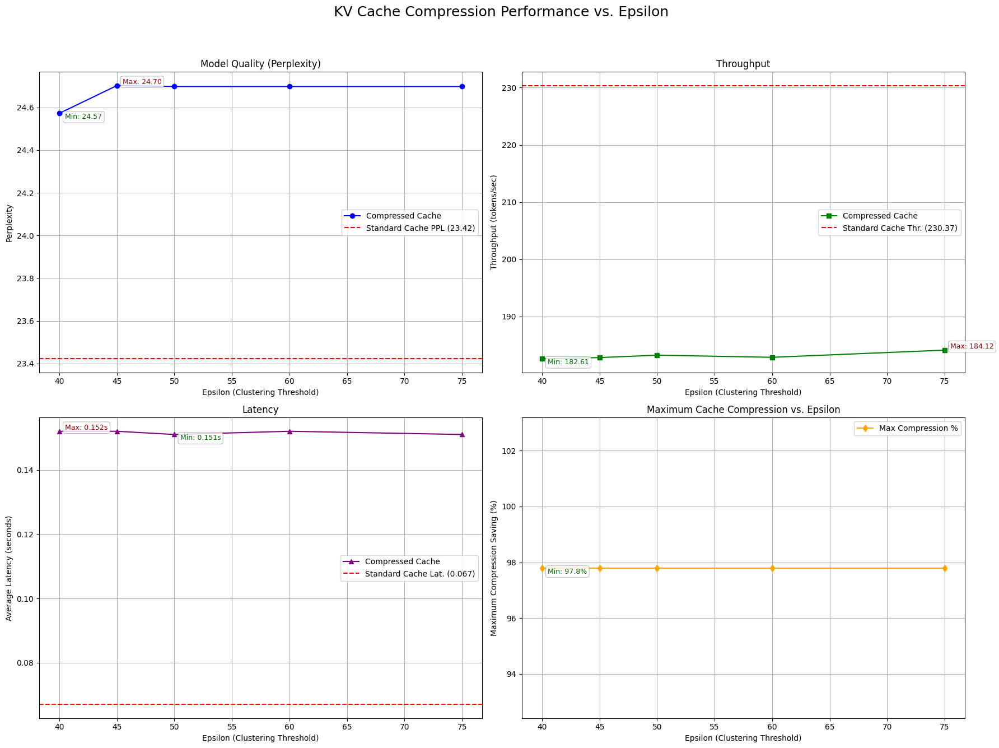

Full detailed experiment results saved to MORE_EPSILONS_detailed_results_gpt2_final_8.xlsx
Summary of experiment results saved to MORE_EPSILONS_summary_results_gpt2_final_8.xlsx


In [ ]:
run_full_experiment(gpt2_model, gpt2_tokenizer, prompt_texts[:100], name="gpt2")

## LLAMA

--- Warming up model... ---
Warmup complete

--- Evaluating with Mode: STANDARD_CACHE ---
Prompt: 0  Boulter starred in two films in 2008 , Daylight Robbery by filmmaker Paris Leonti , and Donkey Punch directed by Olly Blackburn . Boulter portrayed a character named " Sean " in Donkey Punch , who tags along with character " Josh " as the " quiet brother ... who hits it off with Tammi " . Boulter guest starred on a two @-@ part episode arc " Wounds " in May 2008 of the television series Waking the Dead as character " Jimmy Dearden " . He appeared on the television series Survivors as " Neil " in November 2008 . He had a recurring role in ten episodes of the television series Casualty in 2010 , as " Kieron Fletcher " . He portrayed an emergency physician applying for a medical fellowship . He commented on the inherent difficulties in portraying a physician on television : " Playing a doctor is a strange experience . Pretending you know what you 're talking about when you don 't is very b

From v4.47 onwards, when a model cache is to be returned, `generate` will return a `Cache` instance instead by default (as opposed to the legacy tuple of tuples format). If you want to keep returning the legacy format, please set `return_legacy_cache=True`.


Generated tokens: 9
Time taken: 0.113 seconds
Generated part only: 'you \'re doing . " \n'
--------------------------------------------------

KV Cache Shapes and Sizes per Layer (final state, mode=standard_cache):
  Layer 0: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 1: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 2: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 3: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 4: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 5: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 6: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 7: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279, 64]), Size: 558.00 KiB
  Layer 8: K torch.Size([1, 4, 279, 64]), V torch.Size([1, 4, 279

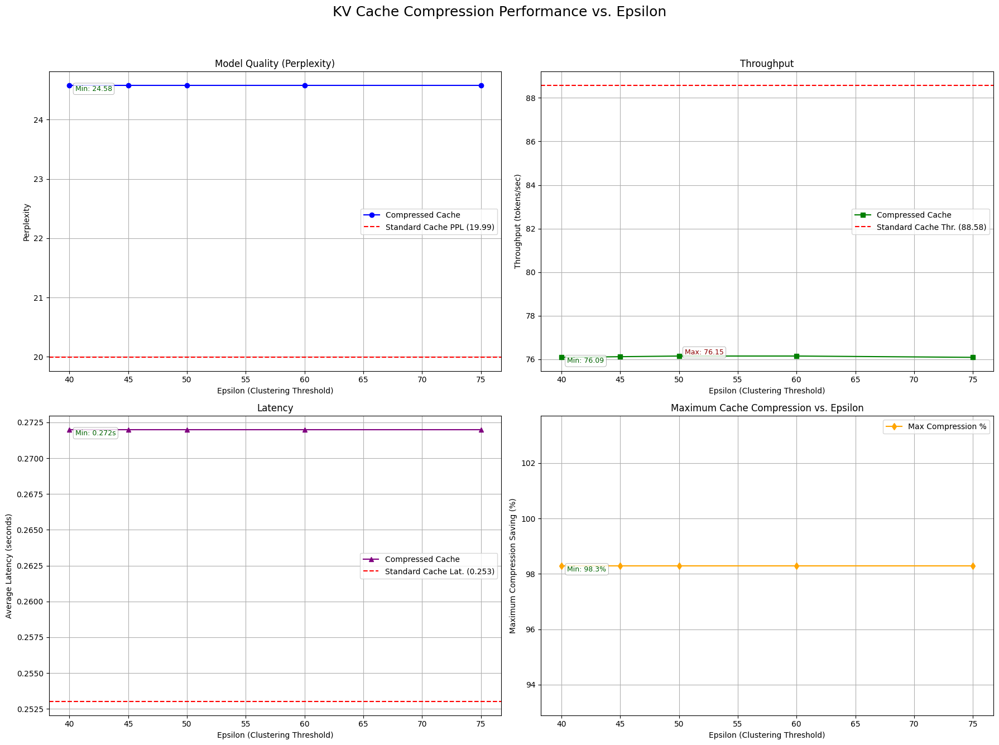

Full detailed experiment results saved to MORE_EPSILONS_detailed_results_llama_final_8.xlsx
Summary of experiment results saved to MORE_EPSILONS_summary_results_llama_final_8.xlsx


In [ ]:
run_full_experiment(llama_model, llama_tokenizer, prompt_texts[:100], name="llama")